<a href="https://colab.research.google.com/github/chaiminwoo0223/Deep-Neural-Network/blob/main/08%20-%20Autoencoders_And_Gans.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import

In [1]:
from sklearn.manifold import TSNE
from collections import Counter
from tensorflow import keras
import tensorflow as tf
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt

%matplotlib inline

# 과소완전 선형 오토인코더로 PCA 수행하기


In [2]:
np.random.seed(4)

def generate_3d_data(m, w1=0.1, w2=0.3, noise=0.1):
    angles = np.random.rand(m) * 3 * np.pi / 2 - 0.5
    data = np.empty((m, 3))
    data[:, 0] = np.cos(angles) + np.sin(angles)/2 + noise * np.random.randn(m) / 2
    data[:, 1] = np.sin(angles) * 0.7 + noise * np.random.randn(m) / 2
    data[:, 2] = data[:, 0] * w1 + data[:, 1] * w2 + noise * np.random.randn(m)
    return data

X_train = generate_3d_data(60)
X_train = X_train - X_train.mean(axis=0, keepdims=0)

In [3]:
tf.random.set_seed(42)

encoder = keras.models.Sequential([keras.layers.Dense(2, input_shape=[3])])
decoder = keras.models.Sequential([keras.layers.Dense(3, input_shape=[2])])
autoencoder = keras.models.Sequential([encoder, decoder])
autoencoder.compile(loss="mse", optimizer=keras.optimizers.SGD(learning_rate=1.5))
history = autoencoder.fit(X_train, X_train, epochs=20)

Epoch 1/20
2/2 [==============================] - 5s 44ms/step - loss: 0.2876
Epoch 2/20
2/2 [==============================] - 0s 24ms/step - loss: 0.1027
Epoch 3/20
2/2 [==============================] - 0s 23ms/step - loss: 0.0579
Epoch 4/20
2/2 [==============================] - 0s 10ms/step - loss: 0.0482
Epoch 5/20
2/2 [==============================] - 0s 17ms/step - loss: 0.0425
Epoch 6/20
2/2 [==============================] - 0s 24ms/step - loss: 0.0297
Epoch 7/20
2/2 [==============================] - 0s 16ms/step - loss: 0.0213
Epoch 8/20
2/2 [==============================] - 0s 21ms/step - loss: 0.0147
Epoch 9/20
2/2 [==============================] - 0s 19ms/step - loss: 0.0092
Epoch 10/20
2/2 [==============================] - 0s 15ms/step - loss: 0.0067
Epoch 11/20
2/2 [==============================] - 0s 10ms/step - loss: 0.0056
Epoch 12/20
2/2 [==============================] - 0s 11ms/step - loss: 0.0050
Epoch 13/20
2/2 [==============================] - 0s 10ms/st

In [4]:
codings = encoder.predict(X_train)
codings

2/2 [==============================] - 0s 7ms/step


array([[-1.0113988 ,  0.8608617 ],
       [ 0.37407675,  0.12571451],
       [-0.9125763 ,  0.82157254],
       [-0.17688894,  0.872313  ],
       [-0.15192884,  0.6506352 ],
       [ 0.39253423, -1.0951737 ],
       [-1.068175  ,  0.7955866 ],
       [-0.36004508, -0.7240863 ],
       [ 0.5997997 , -1.0048611 ],
       [ 0.60695595, -0.44314796],
       [-0.4244084 ,  0.93536997],
       [ 0.28613216, -1.0292647 ],
       [-0.7043462 ,  0.8778468 ],
       [-0.9156345 ,  0.7667724 ],
       [ 0.17947292, -1.040263  ],
       [ 0.17733017,  0.3895511 ],
       [-0.37077466, -0.72147685],
       [ 0.66121227, -0.5642278 ],
       [-0.22336885, -0.87980396],
       [-0.98685116,  0.96678627],
       [ 0.6336001 , -0.47913098],
       [-1.1190494 ,  0.85608506],
       [-0.44051743,  0.9425454 ],
       [-0.778286  ,  0.9735697 ],
       [ 0.22585154, -1.173931  ],
       [-0.1980119 , -0.9273696 ],
       [ 0.30859226,  0.34675914],
       [ 0.2401573 , -1.0605104 ],
       [-0.27049655,

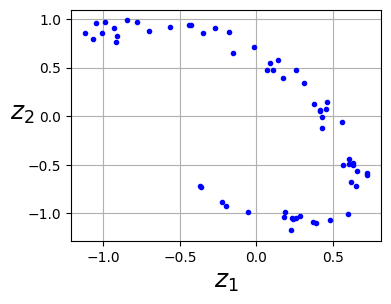

In [5]:
fig = plt.figure(figsize=(4,3))
plt.plot(codings[:,0], codings[:, 1], "b.")
plt.xlabel("$z_1$", fontsize=18)
plt.ylabel("$z_2$", fontsize=18, rotation=0)
plt.grid(True)
plt.show()

# 적층 오토인코더
## 1.케라스를 사용하여 적층 오토인코더 구현하기


In [6]:
(X_train_full, y_train_full), (X_test, y_test) = keras.datasets.fashion_mnist.load_data()
X_train_full = X_train_full.astype(np.float32) / 255
X_test = X_test.astype(np.float32) / 255
X_train, X_valid = X_train_full[:-5000], X_train_full[-5000:]
y_train, y_valid = y_train_full[:-5000], y_train_full[-5000:]

In [7]:
np.random.seed(42)

stacked_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(30, activation="selu"),
])
stacked_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[30]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
stacked_ae = keras.models.Sequential([stacked_encoder, stacked_decoder])
stacked_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.5))
history = stacked_ae.fit(X_train, X_train, epochs=20, validation_data=(X_valid, X_valid))

Epoch 1/20
1719/1719 [==============================] - 15s 4ms/step - loss: 0.3377 - val_loss: 0.3159
Epoch 2/20
1719/1719 [==============================] - 7s 4ms/step - loss: 0.3052 - val_loss: 0.3041
Epoch 3/20
1719/1719 [==============================] - 7s 4ms/step - loss: 0.2981 - val_loss: 0.2966
Epoch 4/20
1719/1719 [==============================] - 8s 4ms/step - loss: 0.2940 - val_loss: 0.2939
Epoch 5/20
1719/1719 [==============================] - 6s 4ms/step - loss: 0.2917 - val_loss: 0.2919
Epoch 6/20
1719/1719 [==============================] - 8s 5ms/step - loss: 0.2899 - val_loss: 0.2908
Epoch 7/20
1719/1719 [==============================] - 7s 4ms/step - loss: 0.2885 - val_loss: 0.2913
Epoch 8/20
1719/1719 [==============================] - 8s 4ms/step - loss: 0.2873 - val_loss: 0.2930
Epoch 9/20
1719/1719 [==============================] - 7s 4ms/step - loss: 0.2863 - val_loss: 0.2888
Epoch 10/20
1719/1719 [==============================] - 7s 4ms/step - loss: 0.28

## 2.재구성 시각화

In [8]:
def plot_image(image):
    plt.imshow(image, cmap="binary")
    plt.axis("off")

def show_reconstructions(model, images=X_valid, n_images=5):
    reconstructions = model.predict(images[:n_images])
    fig = plt.figure(figsize=(n_images * 1.5, 3))
    for image_index in range(n_images):
        plt.subplot(2, n_images, 1 + image_index)
        plot_image(images[image_index])
        plt.subplot(2, n_images, 1 + n_images + image_index)
        plot_image(reconstructions[image_index])

1/1 [==============================] - 0s 71ms/step


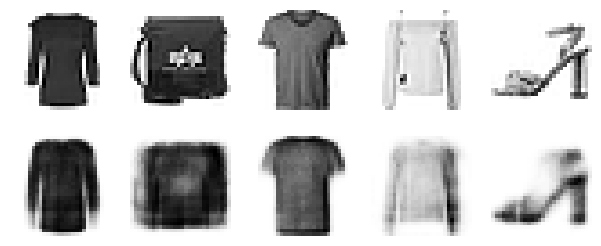

In [9]:
show_reconstructions(stacked_ae)

## 3.패션 MNIST 데이터셋 시각화

In [10]:
X_valid_compressed = stacked_encoder.predict(X_valid)
tsne = TSNE()
X_valid_2D = tsne.fit_transform(X_valid_compressed)
X_valid_2D = (X_valid_2D - X_valid_2D.min()) / (X_valid_2D.max() - X_valid_2D.min())

157/157 [==============================] - 0s 1ms/step


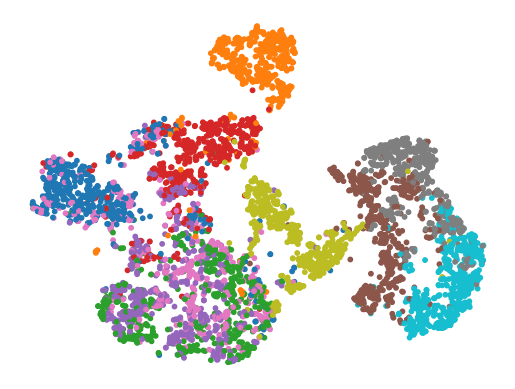

In [11]:
plt.scatter(X_valid_2D[:, 0], X_valid_2D[:, 1], c=y_valid, s=10, cmap="tab10")
plt.axis("off")
plt.show()

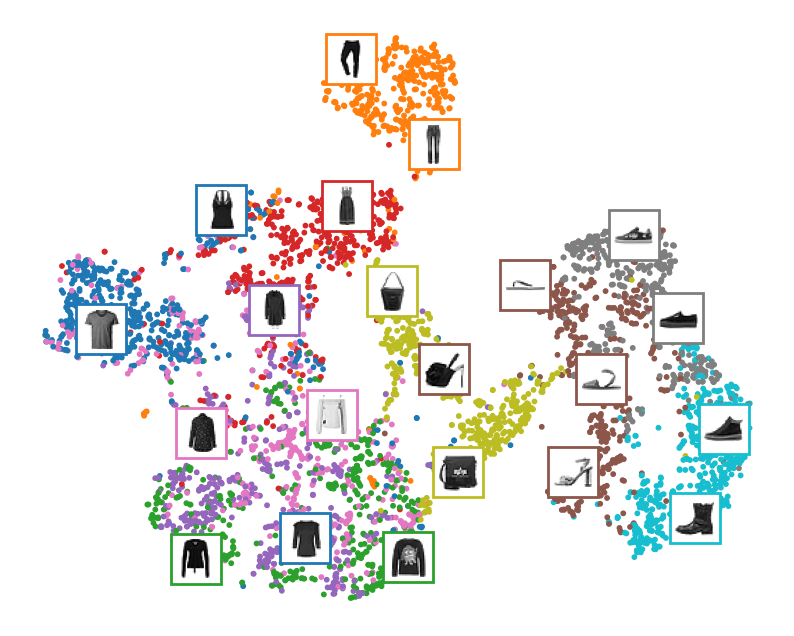

In [12]:
plt.figure(figsize=(10, 8))
cmap = plt.cm.tab10
plt.scatter(X_valid_2D[:, 0], X_valid_2D[:, 1], c=y_valid, s=10, cmap=cmap)
image_positions = np.array([[1., 1.]])
for index, position in enumerate(X_valid_2D):
    dist = np.sum((position - image_positions) ** 2, axis=1)
    if np.min(dist) > 0.02:
        image_positions = np.r_[image_positions, [position]]
        imagebox = mpl.offsetbox.AnnotationBbox(
            mpl.offsetbox.OffsetImage(X_valid[index], cmap="binary"),
            position, bboxprops={"edgecolor": cmap(y_valid[index]), "lw": 2})
        plt.gca().add_artist(imagebox)
plt.axis("off")
plt.show()

## 4.가중치 묶기

In [13]:
class DenseTranspose(keras.layers.Layer):
    def __init__(self, dense, activation=None, **kwargs):
        self.dense = dense
        self.activation = keras.activations.get(activation)
        super().__init__(**kwargs)

    def build(self, batch_input_shape):
        self.biases = self.add_weight(name="bias", shape=[self.dense.input_shape[-1]], initializer="zeros")
        super().build(batch_input_shape)

    def call(self, inputs):
        z = tf.matmul(inputs, self.dense.weights[0], transpose_b=True)
        return self.activation(z + self.biases)

In [14]:
keras.backend.clear_session()
tf.random.set_seed(42)

dense_1 = keras.layers.Dense(100, activation="selu")
dense_2 = keras.layers.Dense(30, activation="selu")
tied_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    dense_1,
    dense_2
])
tied_decoder = keras.models.Sequential([
    DenseTranspose(dense_2, activation="selu"),
    DenseTranspose(dense_1, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
tied_ae = keras.models.Sequential([tied_encoder, tied_decoder])
tied_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.5))
history = tied_ae.fit(X_train, X_train, epochs=10, validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.3270 - val_loss: 0.3097
Epoch 2/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.2974 - val_loss: 0.2960
Epoch 3/10
1719/1719 [==============================] - 6s 4ms/step - loss: 0.2910 - val_loss: 0.2901
Epoch 4/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.2879 - val_loss: 0.2877
Epoch 5/10
1719/1719 [==============================] - 6s 4ms/step - loss: 0.2859 - val_loss: 0.2857
Epoch 6/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.2845 - val_loss: 0.2862
Epoch 7/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.2833 - val_loss: 0.2842
Epoch 8/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.2824 - val_loss: 0.2839
Epoch 9/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.2817 - val_loss: 0.2822
Epoch 10/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.281

1/1 [==============================] - 0s 70ms/step


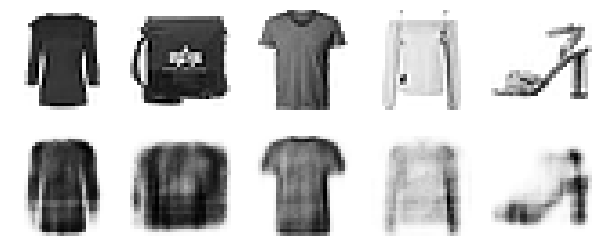

In [15]:
show_reconstructions(tied_ae)
plt.show()

## 5.한번에 하나의 오토인코더 훈련하기

In [16]:
def train_autoencoder(n_neurons, X_train, X_valid, loss, optimizer,
                      n_epochs=10, output_activation=None, metrics=None):
    n_inputs = X_train.shape[-1]
    encoder = keras.models.Sequential([
        keras.layers.Dense(n_neurons, activation="selu", input_shape=[n_inputs])
    ])
    decoder = keras.models.Sequential([
        keras.layers.Dense(n_inputs, activation=output_activation),
    ])
    autoencoder = keras.models.Sequential([encoder, decoder])
    autoencoder.compile(optimizer, loss, metrics=metrics)
    autoencoder.fit(X_train, X_train, epochs=n_epochs, validation_data=(X_valid, X_valid))
    return encoder, decoder, encoder(X_train), encoder(X_valid)

In [17]:
tf.random.set_seed(42)
K = keras.backend

X_train_flat = K.batch_flatten(X_train)
X_valid_flat = K.batch_flatten(X_valid)
enc1, dec1, X_train_enc1, X_valid_enc1 = train_autoencoder(
    100, X_train_flat, X_valid_flat, "binary_crossentropy",
    keras.optimizers.SGD(learning_rate=1.5), output_activation="sigmoid")
enc2, dec2, _, _ = train_autoencoder(
    30, X_train_enc1, X_valid_enc1, "mse",
    keras.optimizers.SGD(learning_rate=0.05), output_activation="selu")

Epoch 1/10
1719/1719 [==============================] - 8s 4ms/step - loss: 0.3452 - val_loss: 0.3114
Epoch 2/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.3027 - val_loss: 0.2994
Epoch 3/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.2939 - val_loss: 0.2926
Epoch 4/10
1719/1719 [==============================] - 6s 3ms/step - loss: 0.2885 - val_loss: 0.2883
Epoch 5/10
1719/1719 [==============================] - 6s 4ms/step - loss: 0.2848 - val_loss: 0.2852
Epoch 6/10
1719/1719 [==============================] - 6s 4ms/step - loss: 0.2822 - val_loss: 0.2828
Epoch 7/10
1719/1719 [==============================] - 6s 3ms/step - loss: 0.2801 - val_loss: 0.2810
Epoch 8/10
1719/1719 [==============================] - 6s 4ms/step - loss: 0.2785 - val_loss: 0.2796
Epoch 9/10
1719/1719 [==============================] - 6s 3ms/step - loss: 0.2772 - val_loss: 0.2784
Epoch 10/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.276

In [18]:
stacked_ae_1_by_1 = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    enc1, enc2, dec2, dec1,
    keras.layers.Reshape([28, 28])
])

1/1 [==============================] - 0s 65ms/step


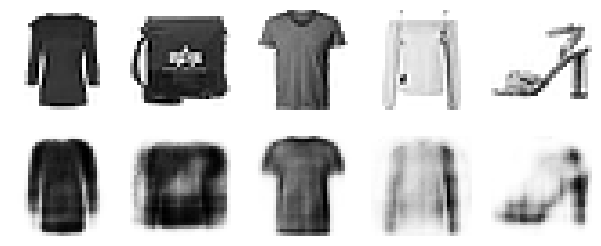

In [19]:
show_reconstructions(stacked_ae_1_by_1)
plt.show()

In [20]:
stacked_ae_1_by_1.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=0.1))
history = stacked_ae_1_by_1.fit(X_train, X_train, epochs=10, validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.2847 - val_loss: 0.2863
Epoch 2/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.2844 - val_loss: 0.2861
Epoch 3/10
1719/1719 [==============================] - 8s 4ms/step - loss: 0.2842 - val_loss: 0.2859
Epoch 4/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.2840 - val_loss: 0.2858
Epoch 5/10
1719/1719 [==============================] - 8s 4ms/step - loss: 0.2839 - val_loss: 0.2856
Epoch 6/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.2837 - val_loss: 0.2855
Epoch 7/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.2836 - val_loss: 0.2854
Epoch 8/10
1719/1719 [==============================] - 8s 4ms/step - loss: 0.2835 - val_loss: 0.2853
Epoch 9/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.2834 - val_loss: 0.2852
Epoch 10/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.283

1/1 [==============================] - 0s 83ms/step


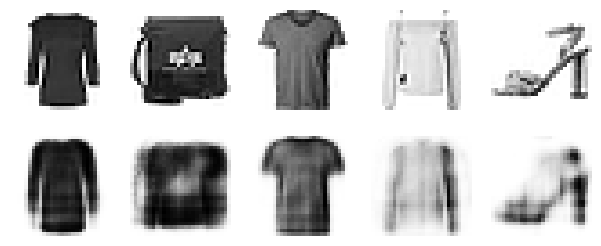

In [21]:
show_reconstructions(stacked_ae_1_by_1)
plt.show()

# 합성곱 오토인코더

In [22]:
tf.random.set_seed(42)

conv_encoder = keras.models.Sequential([
    keras.layers.Reshape([28, 28, 1], input_shape=[28, 28]),
    keras.layers.Conv2D(16, kernel_size=3, padding="SAME", activation="selu"),
    keras.layers.MaxPool2D(pool_size=2),
    keras.layers.Conv2D(32, kernel_size=3, padding="SAME", activation="selu"),
    keras.layers.MaxPool2D(pool_size=2),
    keras.layers.Conv2D(64, kernel_size=3, padding="SAME", activation="selu"),
    keras.layers.MaxPool2D(pool_size=2)
])
conv_decoder = keras.models.Sequential([
    keras.layers.Conv2DTranspose(32, kernel_size=3, strides=2, padding="VALID", activation="selu", input_shape=[3, 3, 64]),
    keras.layers.Conv2DTranspose(16, kernel_size=3, strides=2, padding="SAME", activation="selu"),
    keras.layers.Conv2DTranspose(1, kernel_size=3, strides=2, padding="SAME", activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
conv_ae = keras.models.Sequential([conv_encoder, conv_decoder])
conv_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.0))
history = conv_ae.fit(X_train, X_train, epochs=5, validation_data=(X_valid, X_valid))

Epoch 1/5
1719/1719 [==============================] - 15s 6ms/step - loss: 0.3009 - val_loss: 0.2826
Epoch 2/5
1719/1719 [==============================] - 9s 5ms/step - loss: 0.2761 - val_loss: 0.2730
Epoch 3/5
1719/1719 [==============================] - 10s 6ms/step - loss: 0.2712 - val_loss: 0.2706
Epoch 4/5
1719/1719 [==============================] - 10s 6ms/step - loss: 0.2685 - val_loss: 0.2677
Epoch 5/5
1719/1719 [==============================] - 10s 6ms/step - loss: 0.2666 - val_loss: 0.2671


In [23]:
conv_encoder.summary()
conv_decoder.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape_2 (Reshape)         (None, 28, 28, 1)         0         
                                                                 
 conv2d (Conv2D)             (None, 28, 28, 16)        160       
                                                                 
 max_pooling2d (MaxPooling2  (None, 14, 14, 16)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 14, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 7, 7, 32)          0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 7, 7, 64)        

1/1 [==============================] - 0s 337ms/step


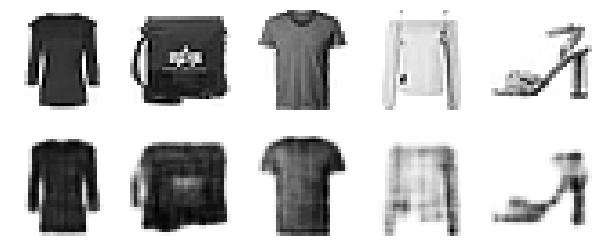

In [24]:
show_reconstructions(conv_ae)
plt.show()

# 순환 오토인코더

In [25]:
tf.random.set_seed(42)

recurrent_encoder = keras.models.Sequential([
    keras.layers.LSTM(100, return_sequences=True, input_shape=[28, 28]),
    keras.layers.LSTM(30)
])
recurrent_decoder = keras.models.Sequential([
    keras.layers.RepeatVector(28, input_shape=[30]),
    keras.layers.LSTM(100, return_sequences=True),
    keras.layers.TimeDistributed(keras.layers.Dense(28, activation="sigmoid"))
])
recurrent_ae = keras.models.Sequential([recurrent_encoder, recurrent_decoder])
recurrent_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(0.1))
history = recurrent_ae.fit(X_train, X_train, epochs=10, validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 25s 11ms/step - loss: 0.5023 - val_loss: 0.4360
Epoch 2/10
1719/1719 [==============================] - 19s 11ms/step - loss: 0.3969 - val_loss: 0.3681
Epoch 3/10
1719/1719 [==============================] - 19s 11ms/step - loss: 0.3591 - val_loss: 0.3573
Epoch 4/10
1719/1719 [==============================] - 18s 11ms/step - loss: 0.3469 - val_loss: 0.3501
Epoch 5/10
1719/1719 [==============================] - 22s 13ms/step - loss: 0.3382 - val_loss: 0.3369
Epoch 6/10
1719/1719 [==============================] - 18s 11ms/step - loss: 0.3309 - val_loss: 0.3330
Epoch 7/10
1719/1719 [==============================] - 19s 11ms/step - loss: 0.3274 - val_loss: 0.3274
Epoch 8/10
1719/1719 [==============================] - 18s 10ms/step - loss: 0.3226 - val_loss: 0.3232
Epoch 9/10
1719/1719 [==============================] - 18s 10ms/step - loss: 0.3198 - val_loss: 0.3185
Epoch 10/10
1719/1719 [==============================] - 19s 11m

1/1 [==============================] - 1s 960ms/step


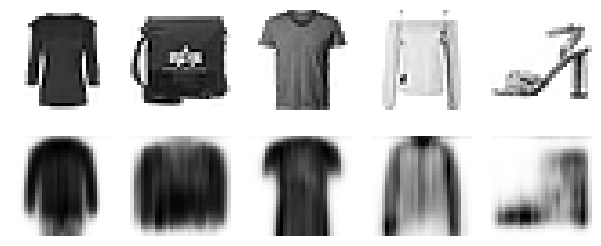

In [26]:
show_reconstructions(recurrent_ae)
plt.show()

# 잡음 제거 오토인코더

In [27]:
tf.random.set_seed(42)

denoising_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.GaussianNoise(0.2),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(30, activation="selu")
])
denoising_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[30]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
denoising_ae = keras.models.Sequential([denoising_encoder, denoising_decoder])
denoising_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.0))
history = denoising_ae.fit(X_train, X_train, epochs=10, validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.3495 - val_loss: 0.3170
Epoch 2/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.3115 - val_loss: 0.3080
Epoch 3/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.3050 - val_loss: 0.3022
Epoch 4/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.3015 - val_loss: 0.2992
Epoch 5/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.2986 - val_loss: 0.2968
Epoch 6/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.2964 - val_loss: 0.2946
Epoch 7/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.2945 - val_loss: 0.2932
Epoch 8/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.2930 - val_loss: 0.2917
Epoch 9/10
1719/1719 [==============================] - 8s 4ms/step - loss: 0.2919 - val_loss: 0.2904
Epoch 10/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.290

1/1 [==============================] - 0s 112ms/step


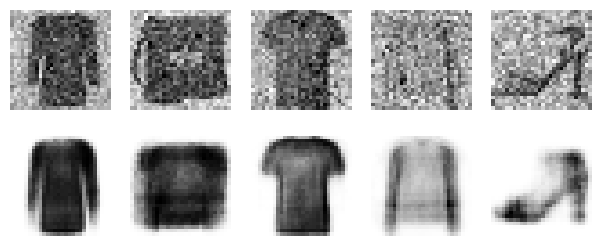

In [28]:
tf.random.set_seed(42)

noise = keras.layers.GaussianNoise(0.2)
show_reconstructions(denoising_ae, noise(X_valid, training=True))
plt.show()

In [29]:
tf.random.set_seed(42)

dropout_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(30, activation="selu")
])
dropout_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[30]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
dropout_ae = keras.models.Sequential([dropout_encoder, dropout_decoder])
dropout_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.0))
history = dropout_ae.fit(X_train, X_train, epochs=10, validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 8s 4ms/step - loss: 0.3551 - val_loss: 0.3203
Epoch 2/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.3183 - val_loss: 0.3121
Epoch 3/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.3126 - val_loss: 0.3072
Epoch 4/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.3091 - val_loss: 0.3048
Epoch 5/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.3065 - val_loss: 0.3021
Epoch 6/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.3044 - val_loss: 0.3006
Epoch 7/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.3029 - val_loss: 0.2986
Epoch 8/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.3018 - val_loss: 0.2976
Epoch 9/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.3008 - val_loss: 0.2967
Epoch 10/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.300

1/1 [==============================] - 0s 71ms/step


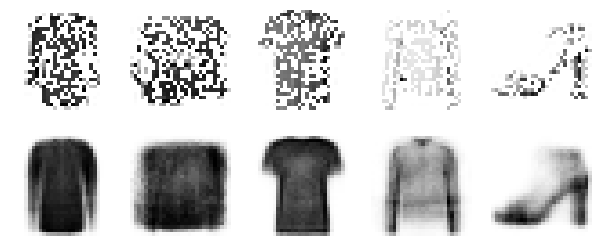

In [30]:
tf.random.set_seed(42)

dropout = keras.layers.Dropout(0.5)
show_reconstructions(dropout_ae, dropout(X_valid, training=True))

# 희소 오토인코더

In [31]:
tf.random.set_seed(42)

sparse_l1_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(300, activation="sigmoid"),
    keras.layers.ActivityRegularization(l1=1e-3)
])
sparse_l1_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[300]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
sparse_l1_ae = keras.models.Sequential([sparse_l1_encoder, sparse_l1_decoder])
sparse_l1_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.0))
history = sparse_l1_ae.fit(X_train, X_train, epochs=10, validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.4320 - val_loss: 0.3837
Epoch 2/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.3691 - val_loss: 0.3633
Epoch 3/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.3541 - val_loss: 0.3502
Epoch 4/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.3440 - val_loss: 0.3421
Epoch 5/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.3367 - val_loss: 0.3350
Epoch 6/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.3302 - val_loss: 0.3298
Epoch 7/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.3259 - val_loss: 0.3286
Epoch 8/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.3230 - val_loss: 0.3236
Epoch 9/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.3207 - val_loss: 0.3218
Epoch 10/10
1719/1719 [==============================] - 7s 4ms/step - loss: 0.318

1/1 [==============================] - 0s 80ms/step


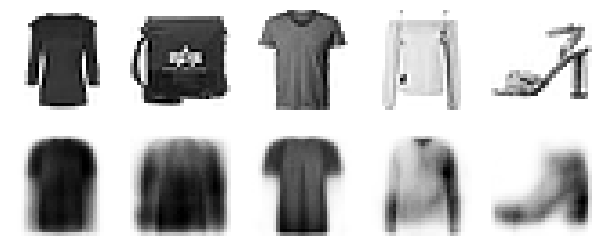

In [32]:
show_reconstructions(sparse_l1_ae)
plt.show()

(0.0, 1.0, 0.0, 0.95)

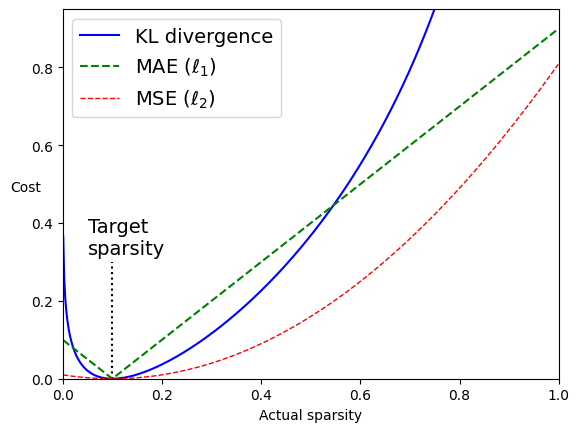

In [33]:
p = 0.1
q = np.linspace(0.001, 0.999, 500)
kl_div = p * np.log(p / q) + (1 - p) * np.log((1 - p) / (1 - q))
mse = (p - q)**2
mae = np.abs(p - q)
plt.plot([p, p], [0, 0.3], "k:")
plt.text(0.05, 0.32, "Target\nsparsity", fontsize=14)
plt.plot(q, kl_div, "b-", label="KL divergence")
plt.plot(q, mae, "g--", label=r"MAE ($\ell_1$)")
plt.plot(q, mse, "r--", linewidth=1, label=r"MSE ($\ell_2$)")
plt.legend(loc="upper left", fontsize=14)
plt.xlabel("Actual sparsity")
plt.ylabel("Cost", rotation=0)
plt.axis([0, 1, 0, 0.95])

In [34]:
K = keras.backend
kl_divergence = keras.losses.kullback_leibler_divergence

class KLDivergenceRegularizer(keras.regularizers.Regularizer):
    def __init__(self, weight, target=0.1):
        self.weight = weight
        self.target = target

    def __call__(self, inputs):
        mean_activities = K.mean(inputs, axis=0)
        return self.weight * (
            kl_divergence(self.target, mean_activities) +
            kl_divergence(1. - self.target, 1. - mean_activities))

In [35]:
tf.random.set_seed(42)

kld_reg = KLDivergenceRegularizer(weight=0.05, target=0.1)
sparse_kl_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(300, activation="sigmoid", activity_regularizer=kld_reg)
])
sparse_kl_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[300]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
sparse_kl_ae = keras.models.Sequential([sparse_kl_encoder, sparse_kl_decoder])
sparse_kl_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.SGD(learning_rate=1.0))
history = sparse_kl_ae.fit(X_train, X_train, epochs=10, validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 10s 5ms/step - loss: 0.4156 - val_loss: 0.3713
Epoch 2/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.3529 - val_loss: 0.3430
Epoch 3/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.3329 - val_loss: 0.3285
Epoch 4/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.3218 - val_loss: 0.3206
Epoch 5/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.3162 - val_loss: 0.3163
Epoch 6/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.3128 - val_loss: 0.3133
Epoch 7/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.3102 - val_loss: 0.3111
Epoch 8/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.3082 - val_loss: 0.3091
Epoch 9/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.3064 - val_loss: 0.3079
Epoch 10/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.30

1/1 [==============================] - 0s 95ms/step


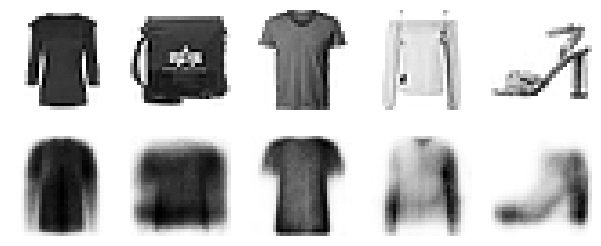

In [36]:
show_reconstructions(sparse_kl_ae)
plt.show()

# 변이형 오토인코더

In [37]:
class Sampling(keras.layers.Layer):
    def call(self, inputs):
        mean, log_var = inputs
        return K.random_normal(tf.shape(log_var)) * K.exp(log_var / 2) + mean

In [38]:
tf.random.set_seed(42)

codings_size = 10
inputs = keras.layers.Input(shape=[28, 28])
z = keras.layers.Flatten()(inputs)
z = keras.layers.Dense(150, activation="selu")(z)
z = keras.layers.Dense(100, activation="selu")(z)
codings_mean = keras.layers.Dense(codings_size)(z)
codings_log_var = keras.layers.Dense(codings_size)(z)
codings = Sampling()([codings_mean, codings_log_var])
variational_encoder = keras.models.Model(inputs=[inputs], outputs=[codings_mean, codings_log_var, codings])

In [39]:
decoder_inputs = keras.layers.Input(shape=[codings_size])
x = keras.layers.Dense(100, activation="selu")(decoder_inputs)
x = keras.layers.Dense(150, activation="selu")(x)
x = keras.layers.Dense(28 * 28, activation="sigmoid")(x)
outputs = keras.layers.Reshape([28, 28])(x)
variational_decoder = keras.models.Model(inputs=[decoder_inputs], outputs=[outputs])

In [40]:
_, _, codings = variational_encoder(inputs)
reconstructions = variational_decoder(codings)
variational_ae = keras.models.Model(inputs=[inputs], outputs=[reconstructions])

In [41]:
latent_loss = -0.5 * K.sum(1 + codings_log_var - K.exp(codings_log_var) - K.square(codings_mean), axis=-1)
variational_ae.add_loss(K.mean(latent_loss) / 784.)
variational_ae.compile(loss="binary_crossentropy", optimizer="rmsprop")
history = variational_ae.fit(X_train, X_train, epochs=25, batch_size=128, validation_data=(X_valid, X_valid))

Epoch 1/25
430/430 [==============================] - 5s 7ms/step - loss: 0.4119 - val_loss: 0.3735
Epoch 2/25
430/430 [==============================] - 4s 8ms/step - loss: 0.3553 - val_loss: 0.3527
Epoch 3/25
430/430 [==============================] - 3s 6ms/step - loss: 0.3437 - val_loss: 0.3412
Epoch 4/25
430/430 [==============================] - 3s 6ms/step - loss: 0.3374 - val_loss: 0.3384
Epoch 5/25
430/430 [==============================] - 3s 6ms/step - loss: 0.3331 - val_loss: 0.3338
Epoch 6/25
430/430 [==============================] - 3s 6ms/step - loss: 0.3300 - val_loss: 0.3292
Epoch 7/25
430/430 [==============================] - 3s 8ms/step - loss: 0.3275 - val_loss: 0.3282
Epoch 8/25
430/430 [==============================] - 2s 6ms/step - loss: 0.3256 - val_loss: 0.3281
Epoch 9/25
430/430 [==============================] - 2s 6ms/step - loss: 0.3242 - val_loss: 0.3254
Epoch 10/25
430/430 [==============================] - 3s 6ms/step - loss: 0.3229 - val_loss: 0.3252

1/1 [==============================] - 0s 127ms/step


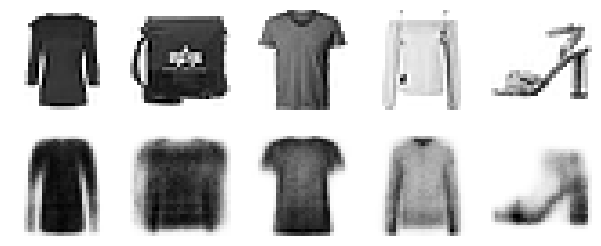

In [42]:
show_reconstructions(variational_ae)
plt.show()

## 1.패션 MNIST 이미지 생성하기

In [43]:
def plot_multiple_images(images, n_cols=None):
    n_cols = n_cols or len(images)
    n_rows = (len(images) - 1) // n_cols + 1
    if images.shape[-1] == 1:
        images = np.squeeze(images, axis=-1)
    plt.figure(figsize=(n_cols, n_rows))
    for index, image in enumerate(images):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(image, cmap="binary")
        plt.axis("off")

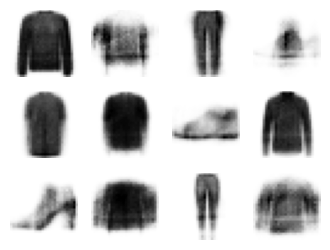

In [44]:
tf.random.set_seed(42)

codings = tf.random.normal(shape=[12, codings_size])
images = variational_decoder(codings).numpy()
plot_multiple_images(images, 4)

## 2.시맨틱 보간

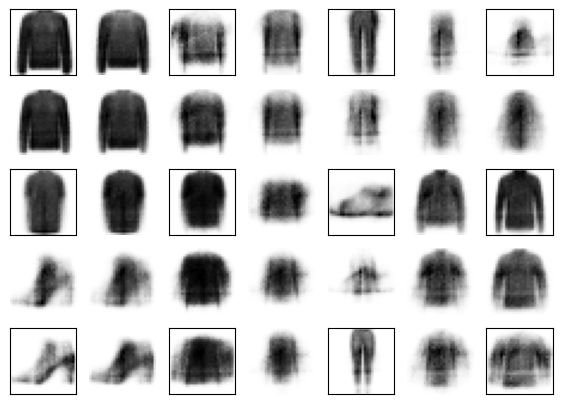

In [45]:
tf.random.set_seed(42)

codings_grid = tf.reshape(codings, [1, 3, 4, codings_size])
larger_grid = tf.image.resize(codings_grid, size=[5, 7])
interpolated_codings = tf.reshape(larger_grid, [-1, codings_size])
images = variational_decoder(interpolated_codings).numpy()
plt.figure(figsize=(7, 5))
for index, image in enumerate(images):
    plt.subplot(5, 7, index + 1)
    if index%7%2==0 and index//7%2==0:
        plt.gca().get_xaxis().set_visible(False)
        plt.gca().get_yaxis().set_visible(False)
    else:
        plt.axis("off")
    plt.imshow(image, cmap="binary")

# 생성적 적대 신경망

In [46]:
tf.random.set_seed(42)

codings_size = 30
generator = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[codings_size]),
    keras.layers.Dense(150, activation="selu"),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
discriminator = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(150, activation="selu"),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.Dense(1, activation="sigmoid")
])
gan = keras.models.Sequential([generator, discriminator])

In [47]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [48]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train).shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

In [49]:
def train_gan(gan, dataset, batch_size, codings_size, n_epochs=30):
    generator, discriminator = gan.layers
    for epoch in range(n_epochs):
        print("Epoch {}/{}".format(epoch + 1, n_epochs))
        for X_batch in dataset:
            noise = tf.random.normal(shape=[batch_size, codings_size])
            generated_images = generator(noise)
            X_fake_and_real = tf.concat([generated_images, X_batch], axis=0)
            y1 = tf.constant([[0.]] * batch_size + [[1.]] * batch_size)
            discriminator.trainable = True
            discriminator.train_on_batch(X_fake_and_real, y1)
            noise = tf.random.normal(shape=[batch_size, codings_size])
            y2 = tf.constant([[1.]] * batch_size)
            discriminator.trainable = False
            gan.train_on_batch(noise, y2)
        plot_multiple_images(generated_images, 8)
        plt.show()

Epoch 1/1


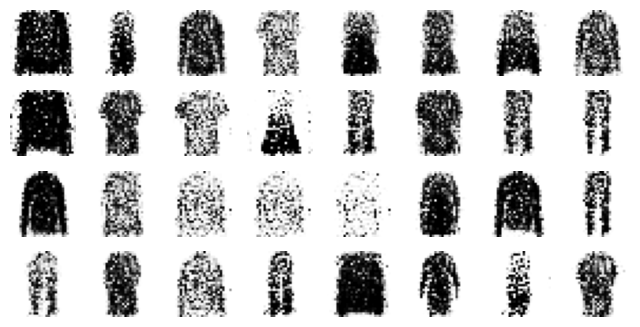

In [50]:
train_gan(gan, dataset, batch_size, codings_size, n_epochs=1)

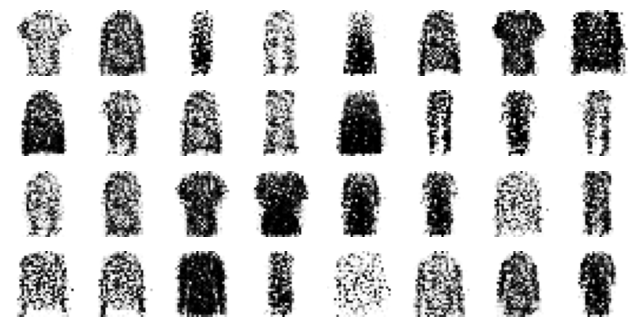

In [51]:
tf.random.set_seed(42)

noise = tf.random.normal(shape=[batch_size, codings_size])
generated_images = generator(noise)
plot_multiple_images(generated_images, 8)

Epoch 1/30


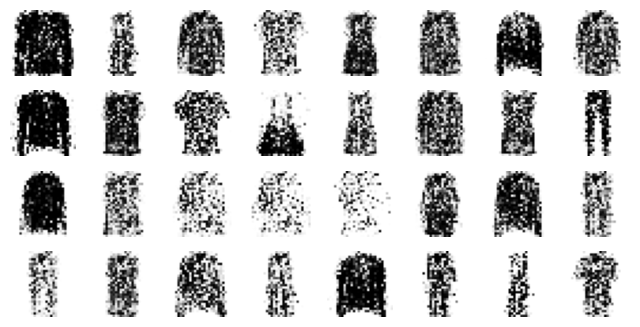

Epoch 2/30


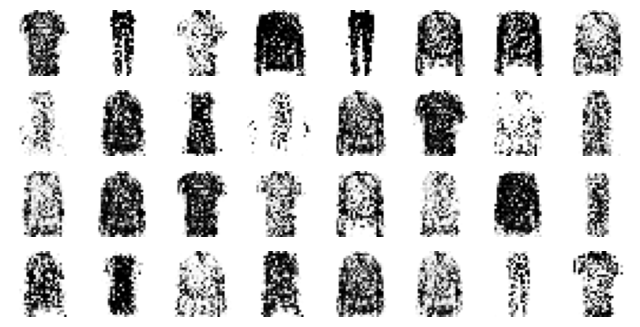

Epoch 3/30


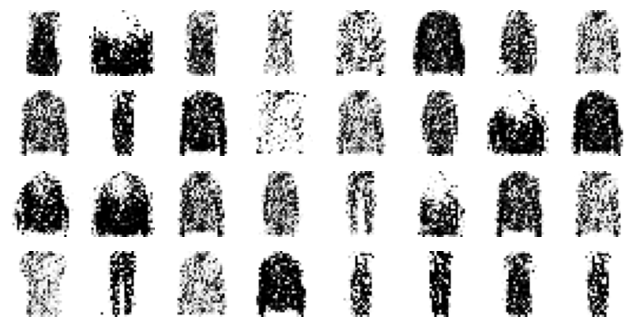

Epoch 4/30


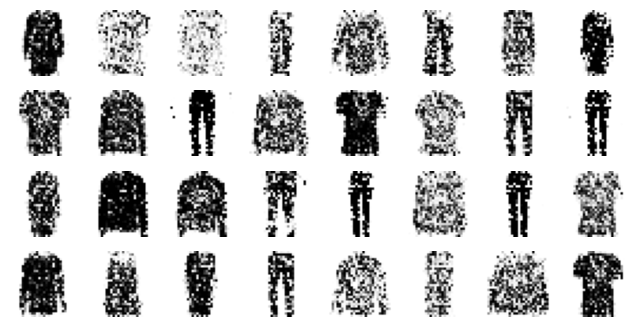

Epoch 5/30


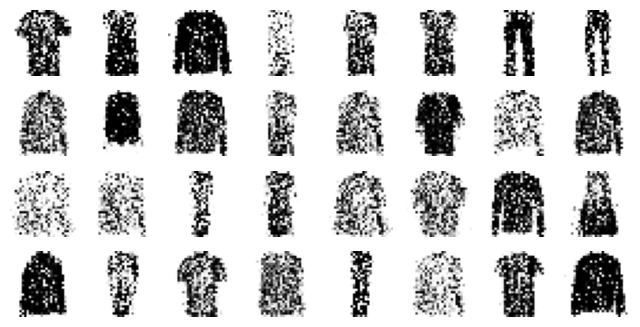

Epoch 6/30


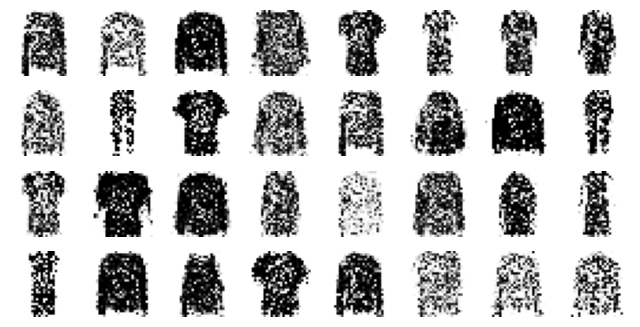

Epoch 7/30


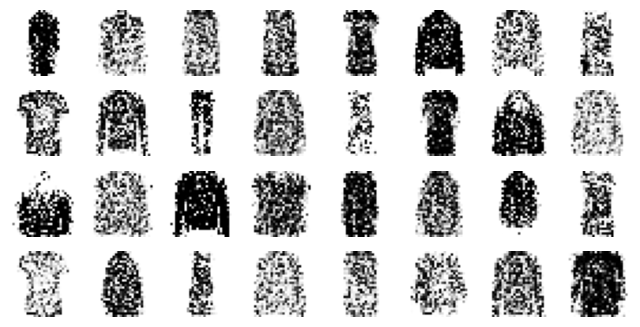

Epoch 8/30


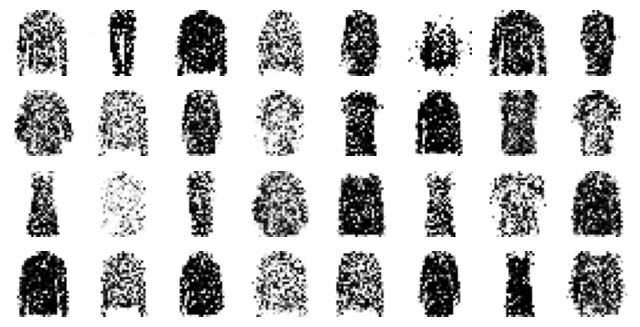

Epoch 9/30


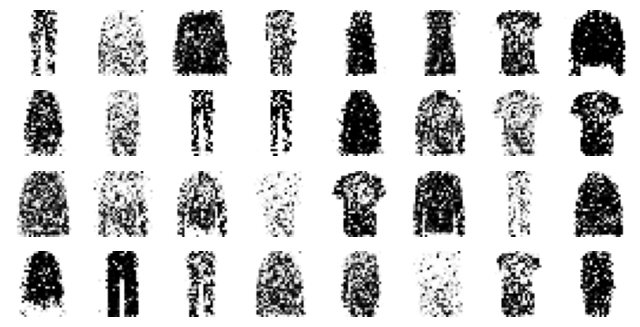

Epoch 10/30


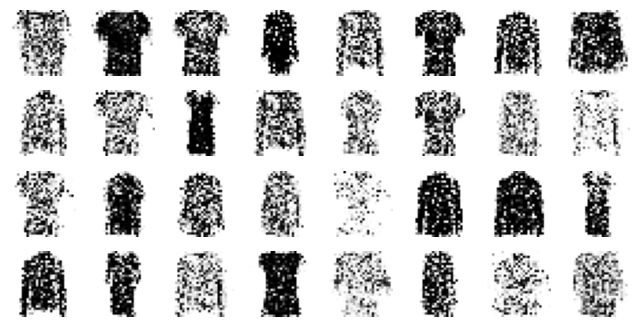

Epoch 11/30


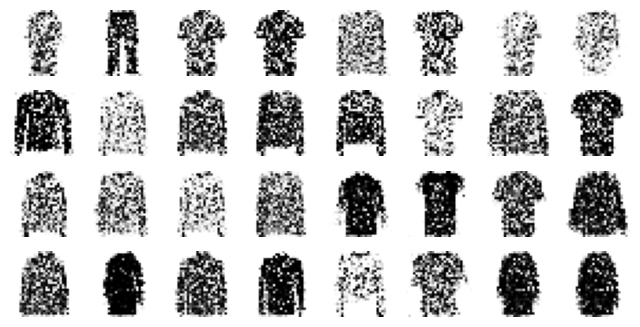

Epoch 12/30


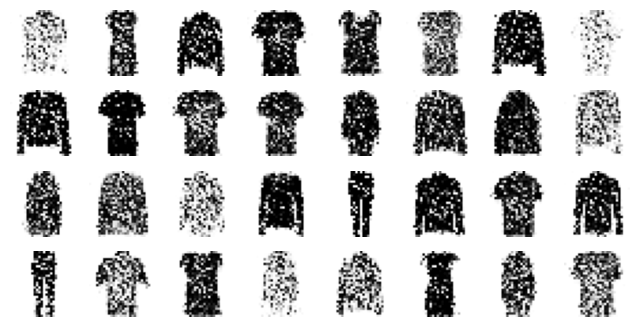

Epoch 13/30


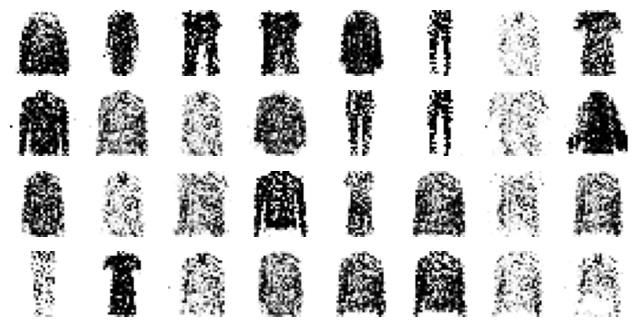

Epoch 14/30


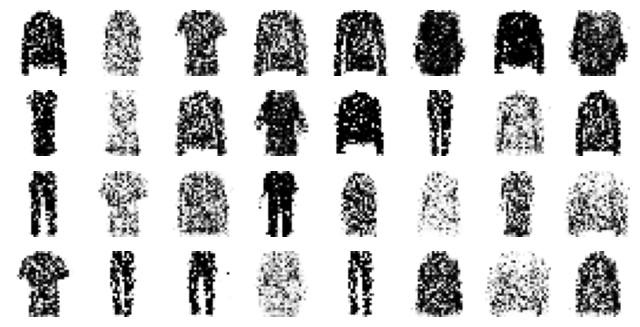

Epoch 15/30


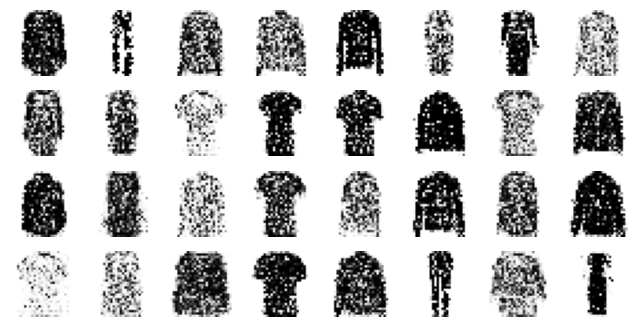

Epoch 16/30


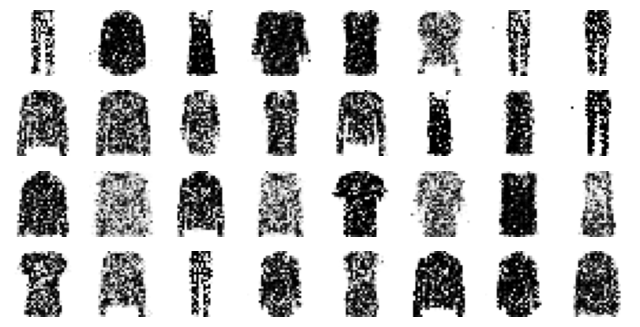

Epoch 17/30


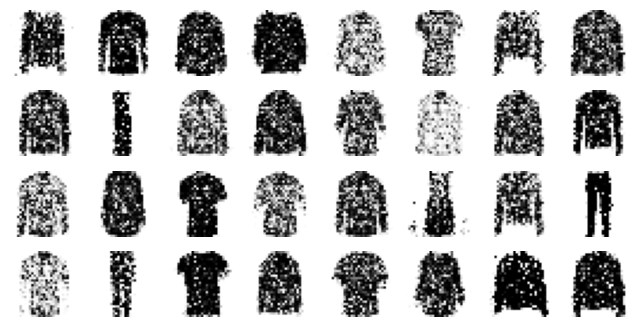

Epoch 18/30


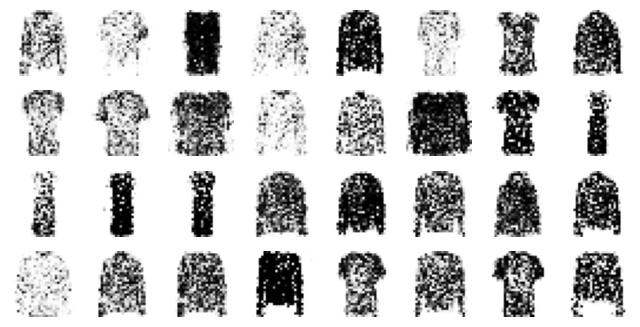

Epoch 19/30


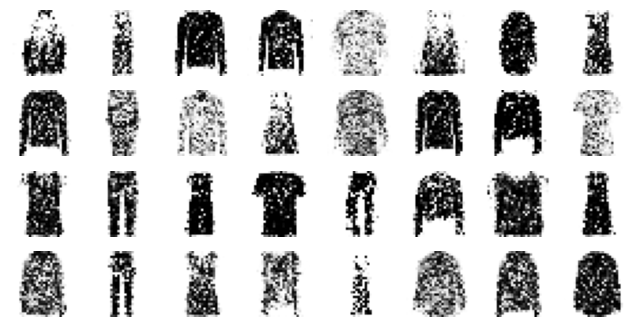

Epoch 20/30


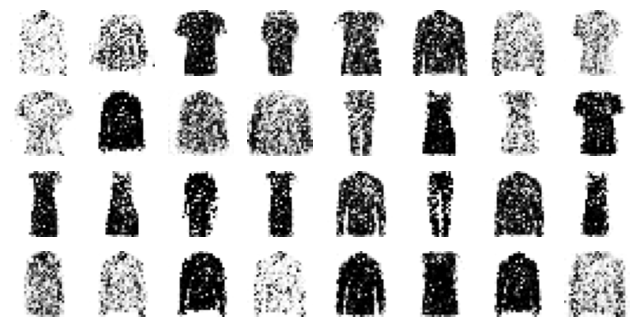

Epoch 21/30


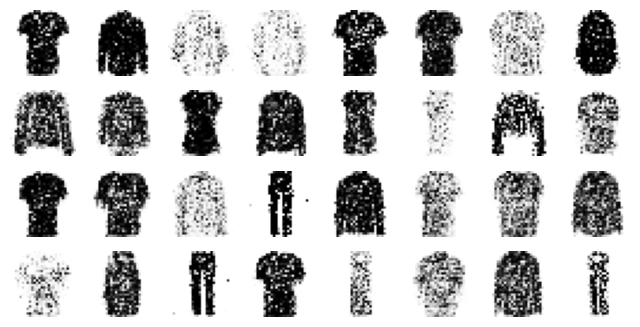

Epoch 22/30


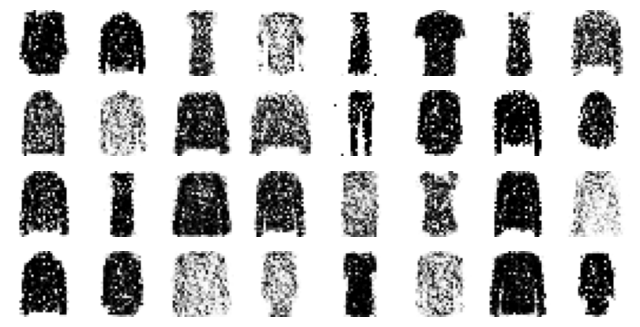

Epoch 23/30


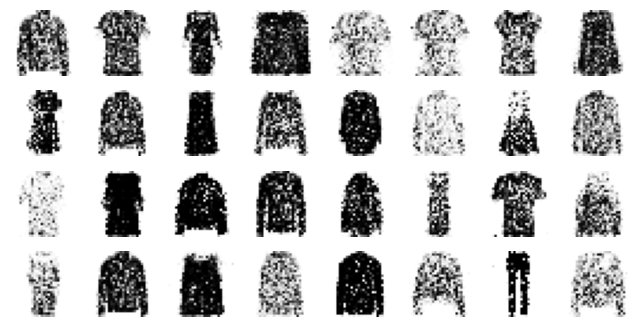

Epoch 24/30


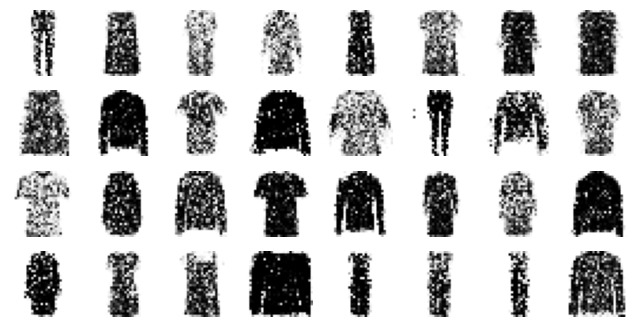

Epoch 25/30


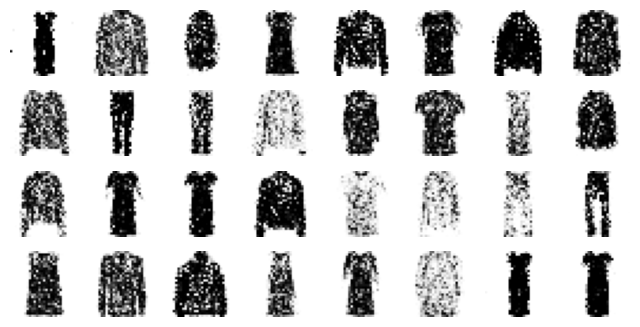

Epoch 26/30


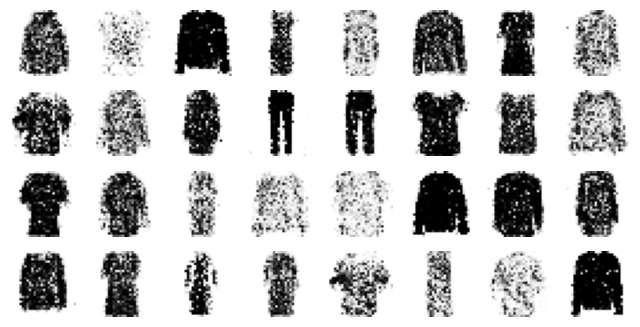

Epoch 27/30


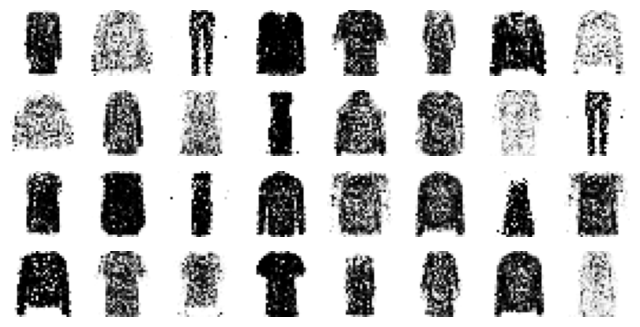

Epoch 28/30


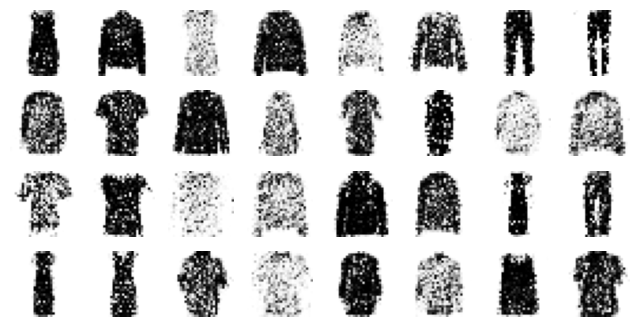

Epoch 29/30


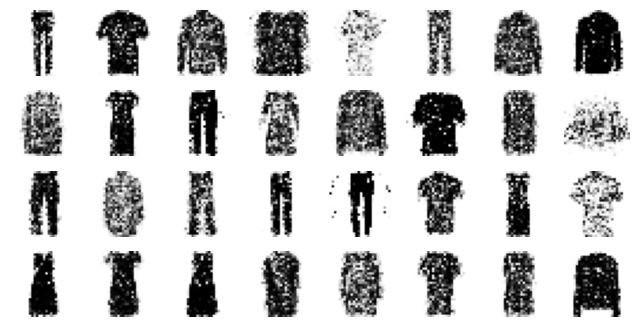

Epoch 30/30


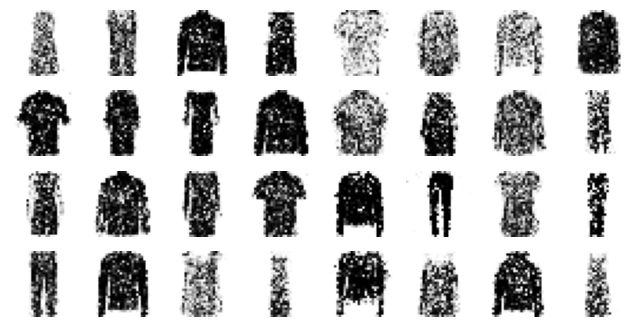

In [52]:
train_gan(gan, dataset, batch_size, codings_size)

## 1.심층 합성곱 GAN

In [53]:
tf.random.set_seed(42)

codings_size = 100
generator = keras.models.Sequential([
    keras.layers.Dense(7 * 7 * 128, input_shape=[codings_size]),
    keras.layers.Reshape([7, 7, 128]),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding="SAME", activation="selu"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(1, kernel_size=5, strides=2, padding="SAME", activation="tanh"),
])
discriminator = keras.models.Sequential([
    keras.layers.Conv2D(64, kernel_size=5, strides=2, padding="SAME", activation=keras.layers.LeakyReLU(0.2),
                        input_shape=[28, 28, 1]),
    keras.layers.Dropout(0.4),
    keras.layers.Conv2D(128, kernel_size=5, strides=2, padding="SAME", activation=keras.layers.LeakyReLU(0.2)),
    keras.layers.Dropout(0.4),
    keras.layers.Flatten(),
    keras.layers.Dense(1, activation="sigmoid")
])
gan = keras.models.Sequential([generator, discriminator])

In [54]:
discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [55]:
# 크기 변경과 스케일 조정
X_train_dcgan = X_train.reshape(-1, 28, 28, 1) * 2. - 1.

In [56]:
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(X_train_dcgan)
dataset = dataset.shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

Epoch 1/30


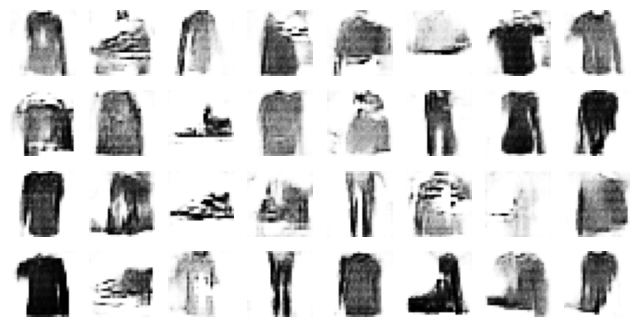

Epoch 2/30


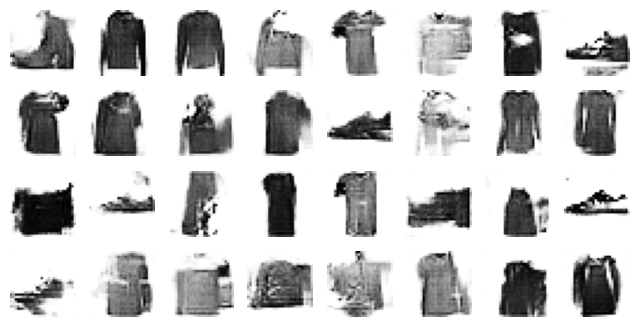

Epoch 3/30


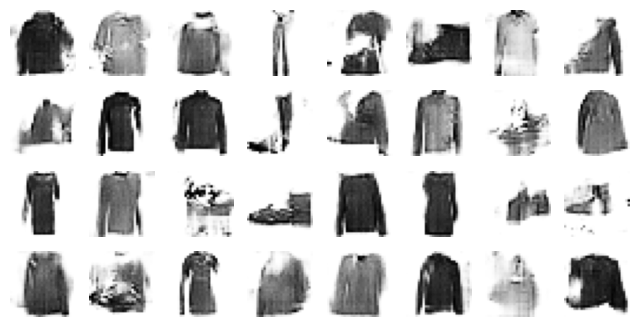

Epoch 4/30


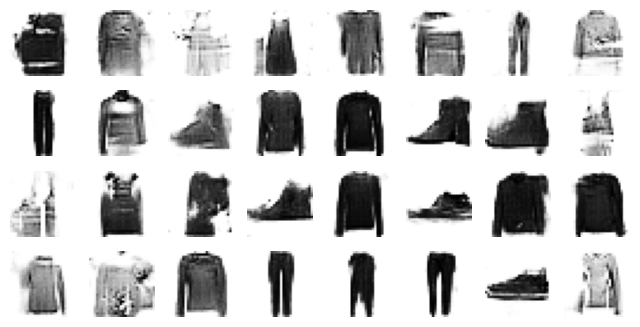

Epoch 5/30


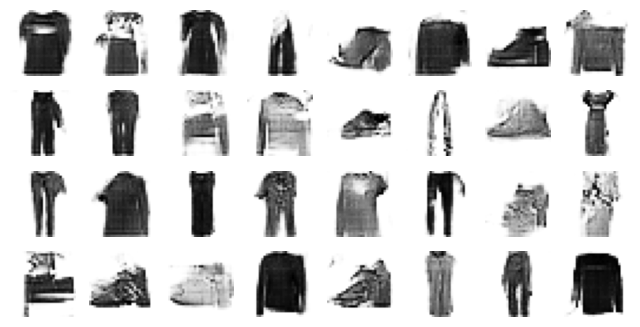

Epoch 6/30


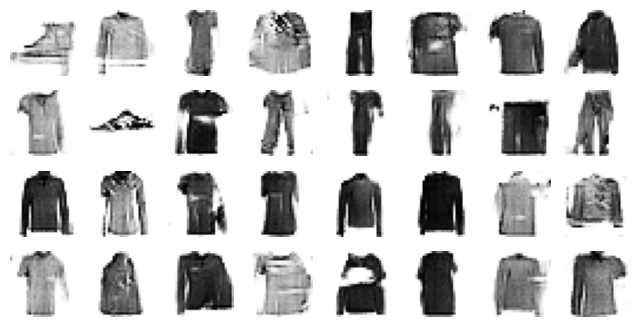

Epoch 7/30


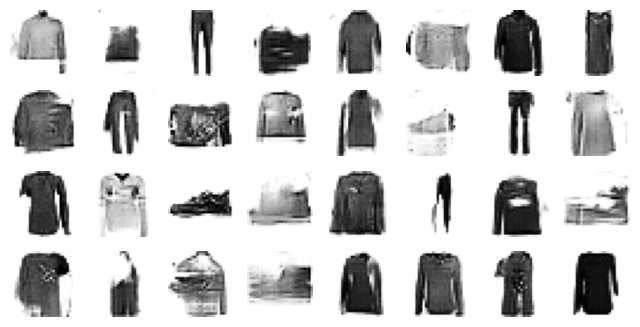

Epoch 8/30


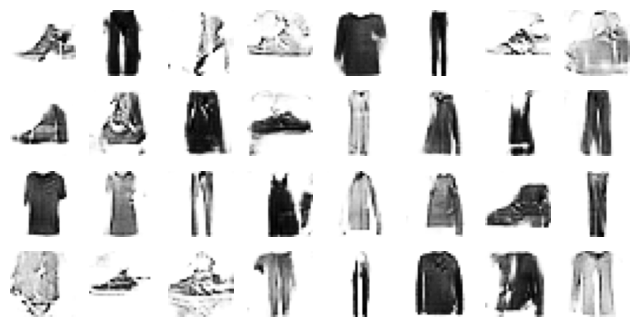

Epoch 9/30


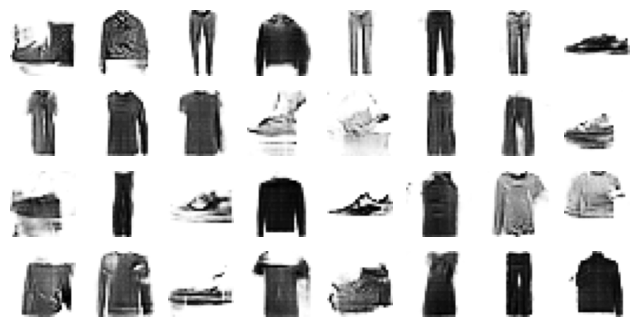

Epoch 10/30


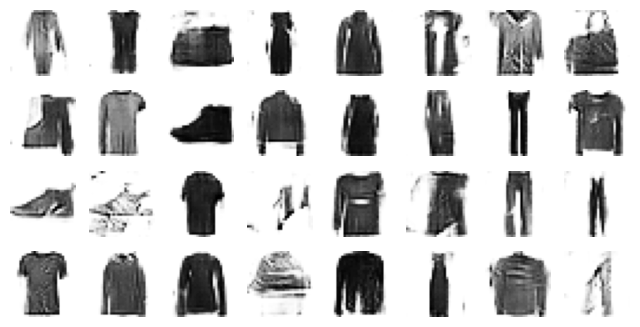

Epoch 11/30


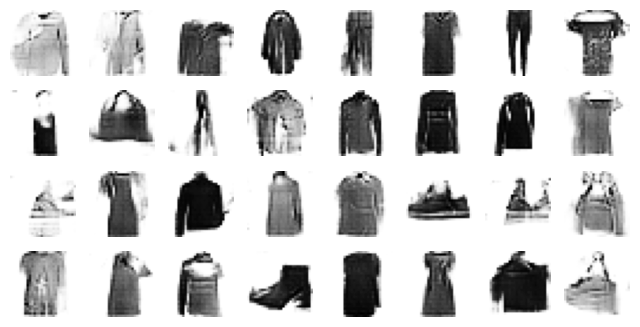

Epoch 12/30


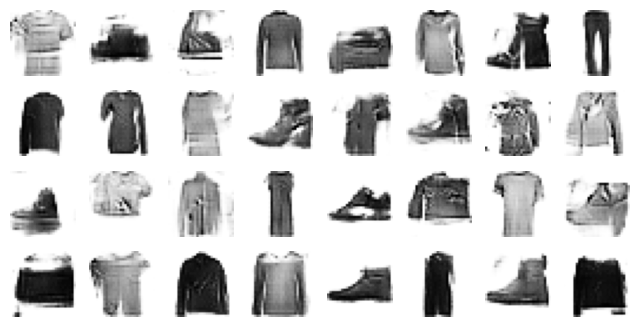

Epoch 13/30


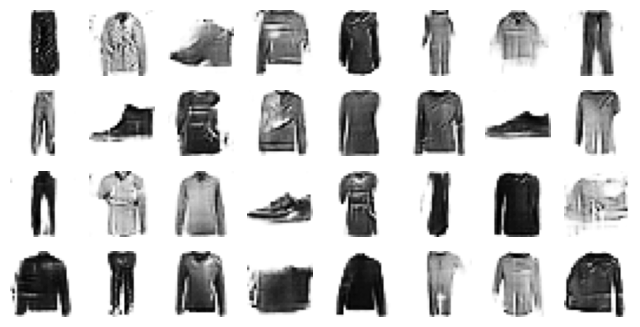

Epoch 14/30


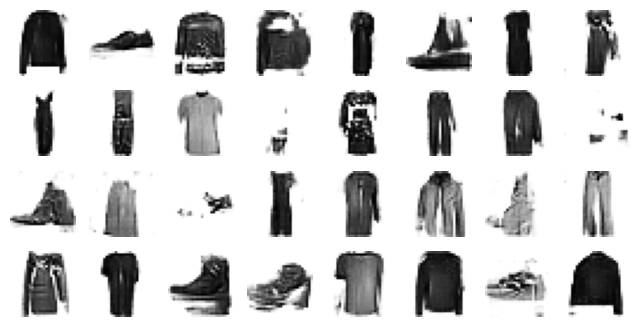

Epoch 15/30


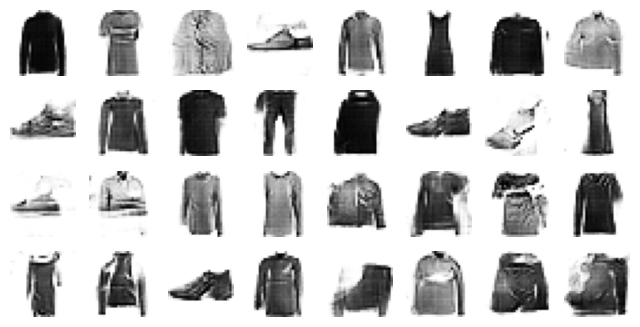

Epoch 16/30


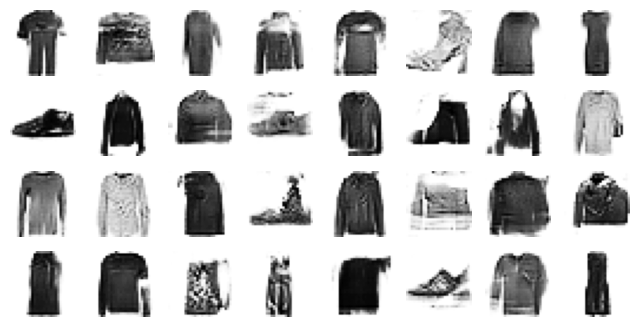

Epoch 17/30


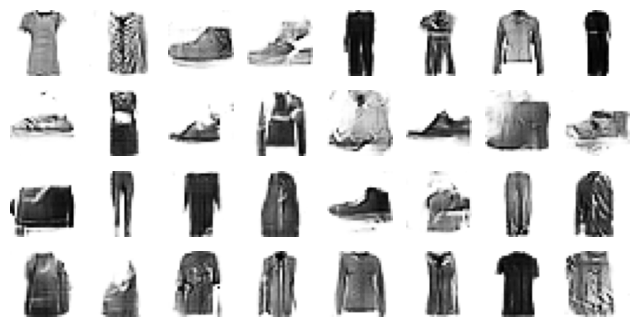

Epoch 18/30


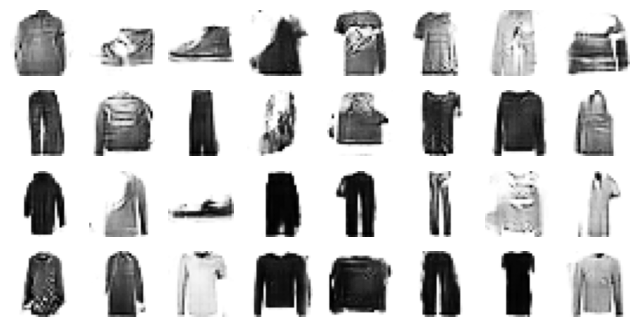

Epoch 19/30


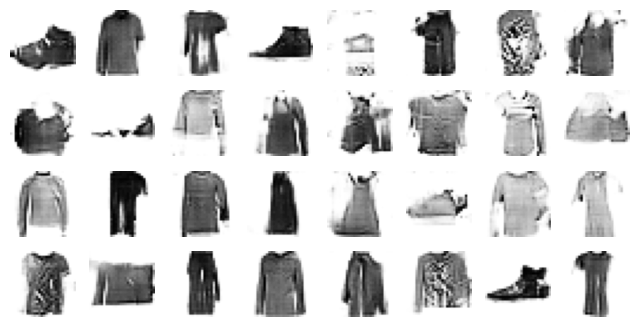

Epoch 20/30


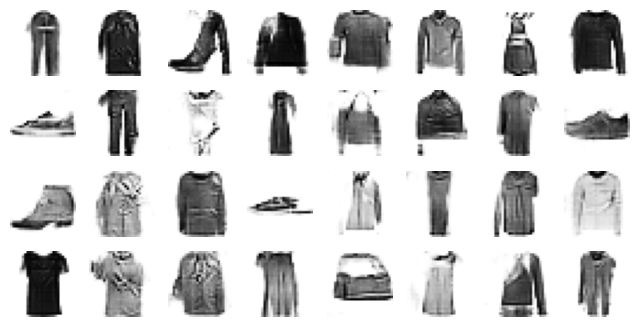

Epoch 21/30


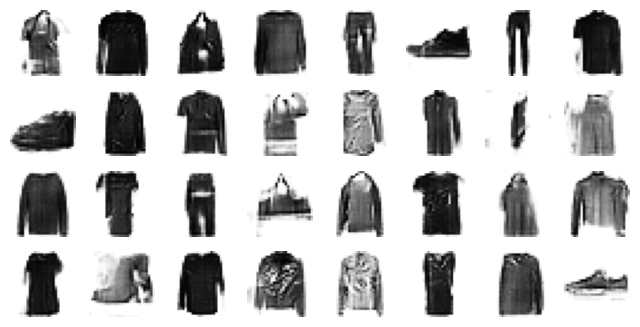

Epoch 22/30


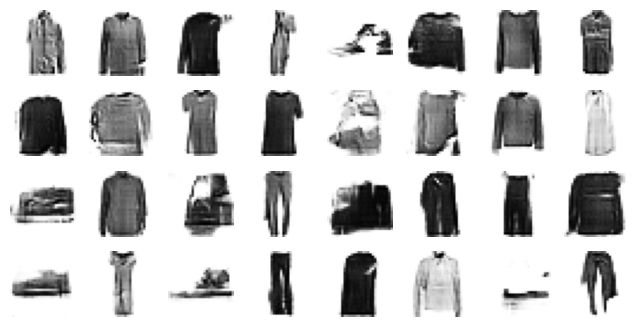

Epoch 23/30


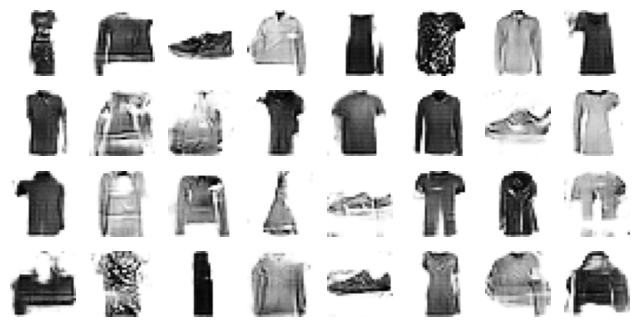

Epoch 24/30


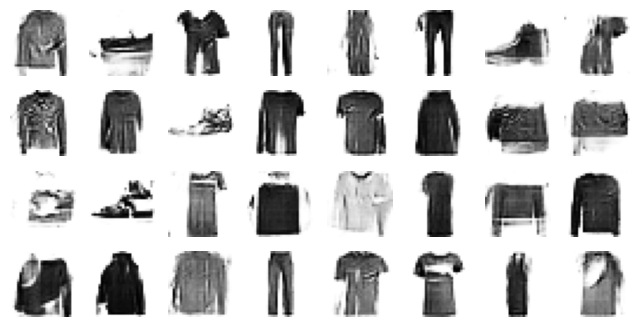

Epoch 25/30


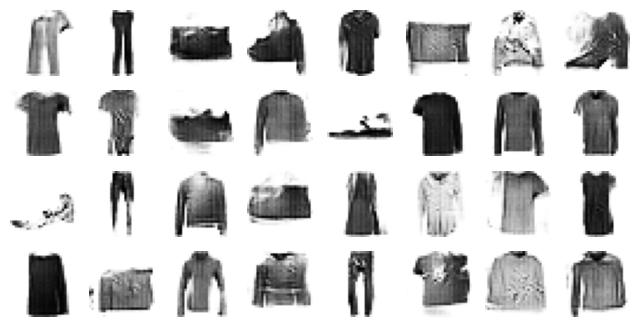

Epoch 26/30


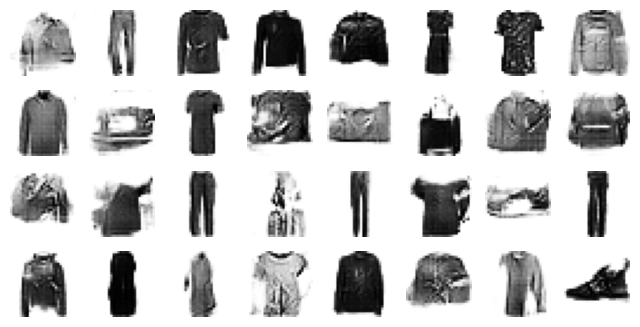

Epoch 27/30


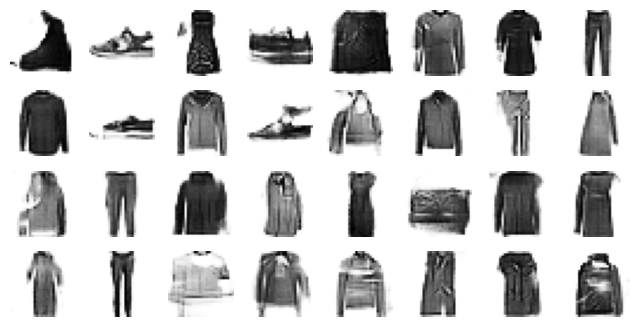

Epoch 28/30


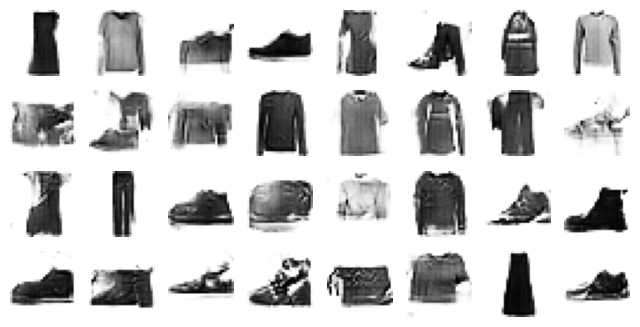

Epoch 29/30


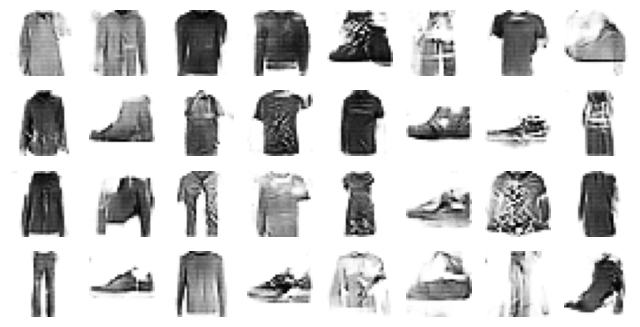

Epoch 30/30


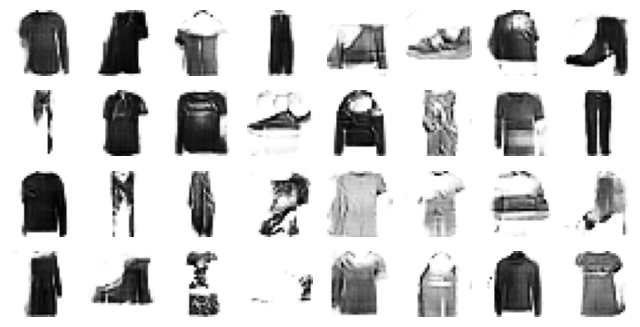

In [57]:
train_gan(gan, dataset, batch_size, codings_size)

## 2.이진 오토인코더를 사용한 해싱

In [58]:
tf.random.set_seed(42)

hashing_encoder = keras.models.Sequential([
    keras.layers.Flatten(input_shape=[28, 28]),
    keras.layers.Dense(100, activation="selu"),
    keras.layers.GaussianNoise(15.),
    keras.layers.Dense(16, activation="sigmoid"),
])
hashing_decoder = keras.models.Sequential([
    keras.layers.Dense(100, activation="selu", input_shape=[16]),
    keras.layers.Dense(28 * 28, activation="sigmoid"),
    keras.layers.Reshape([28, 28])
])
hashing_ae = keras.models.Sequential([hashing_encoder, hashing_decoder])
hashing_ae.compile(loss="binary_crossentropy", optimizer=keras.optimizers.Nadam())
history = hashing_ae.fit(X_train, X_train, epochs=10, validation_data=(X_valid, X_valid))

Epoch 1/10
1719/1719 [==============================] - 13s 5ms/step - loss: 0.4059 - val_loss: 0.3912
Epoch 2/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.3671 - val_loss: 0.3708
Epoch 3/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.3570 - val_loss: 0.3632
Epoch 4/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.3522 - val_loss: 0.3511
Epoch 5/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.3490 - val_loss: 0.3492
Epoch 6/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.3461 - val_loss: 0.3460
Epoch 7/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.3442 - val_loss: 0.3462
Epoch 8/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.3422 - val_loss: 0.3448
Epoch 9/10
1719/1719 [==============================] - 9s 5ms/step - loss: 0.3408 - val_loss: 0.3422
Epoch 10/10
1719/1719 [==============================] - 8s 5ms/step - loss: 0.33

1/1 [==============================] - 0s 72ms/step


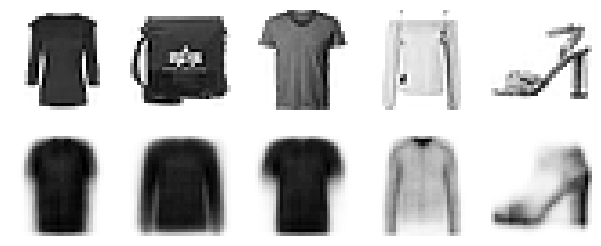

In [59]:
show_reconstructions(hashing_ae)
plt.show()

In [60]:
hashes = np.round(hashing_encoder.predict(X_valid)).astype(np.int32)
hashes *= np.array([[2**bit for bit in range(16)]])
hashes = hashes.sum(axis=1)
for h in hashes[:5]:
    print("{:016b}".format(h))
print("...")

157/157 [==============================] - 0s 2ms/step
0100001110111000
0100001000111000
0100001100111000
0010101010001000
0010101000100011
...


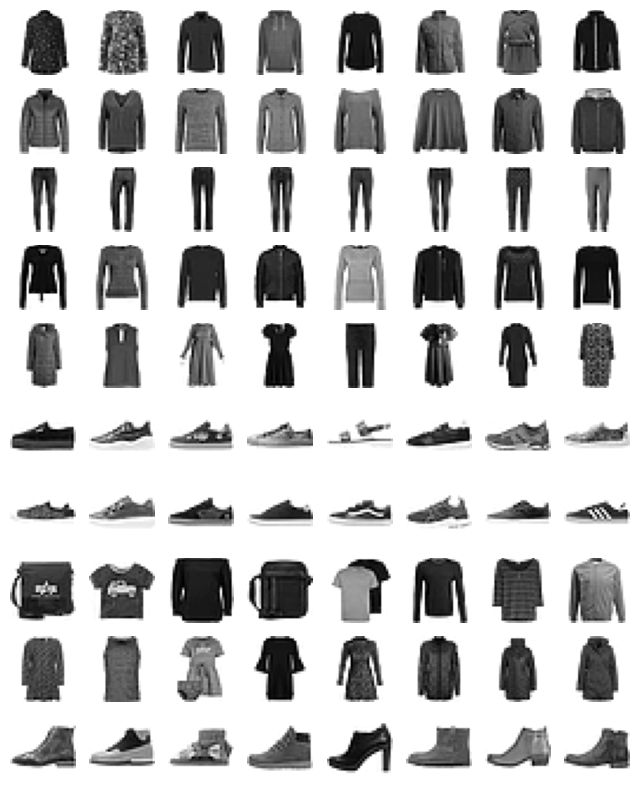

In [61]:
n_hashes = 10
n_images = 8
top_hashes = Counter(hashes).most_common(n_hashes)
plt.figure(figsize=(n_images, n_hashes))
for hash_index, (image_hash, hash_count) in enumerate(top_hashes):
    indices = (hashes == image_hash)
    for index, image in enumerate(X_valid[indices][:n_images]):
        plt.subplot(n_hashes, n_images, hash_index * n_images + index + 1)
        plt.imshow(image, cmap="binary")
        plt.axis("off")